In [2]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

"""
@author: M Arshad Zahangir Chowdhury

Identify experiments, plot roc, pr curve, grad cam maps etc.

"""

%matplotlib inline 

import sys
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import signal
from ipywidgets import interactive
import seaborn as sns  #heat map
import glob # batch processing of images

if '../../' not in sys.path:
    sys.path.append('../../')

import math
from scipy import signal
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve 
from sklearn.metrics import auc
from sklearn.metrics import roc_auc_score

import itertools

from vocnet.misc.utils import classifier_internals
from vocnet.misc.utils import clf_post_processor


# from vocnet.spectral_datasets.IR_datasets import IR_data
# from vocnet.spectral_datasets.IR_datasets import spectra_to_img
from vocnet.spectral_datasets.THz_datasets import THz_data

from vocnet.misc.aperture import publication_fig
from vocnet.misc.voc_net_utils import multiclass_roc_auc_score
from vocnet.misc.voc_net_utils import plot_raw_scores
from vocnet.misc.voc_net_utils import simple_spectrum_fig
from vocnet.misc.voc_net_utils import simple_plot_raw_scores

from vocnet.misc.voc_net_utils import plot_sequential_group_prediction



import tensorflow as tf
from tensorflow.keras import datasets, layers, models


# GPU_mem_limit=1.0
# gpus = tf.config.experimental.list_physical_devices('GPU')
# if gpus:
#     try:
#         tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=GPU_mem_limit*1000.0)])

#     except RuntimeError as e:
#         print(e)        


# !pip install git+https://github.com/tensorflow/docs

import tensorflow_docs as tfdocs
import tensorflow_docs.modeling
import tensorflow_docs.plots
import tensorflow_docs.modeling
from tensorflow.keras import regularizers

from vocnet.models.voc_net_models import get_callbacks
from vocnet.models.voc_net_models import get_optimizer
from vocnet.models.voc_net_models import compile_and_fit


from vocnet.models.voc_net_models import C1f1k3_AP1_D12
from vocnet.models.voc_net_models import C1f1k3_MP1_D12

from vocnet.models.voc_net_models import C2f1k3_AP1_D12
from vocnet.models.voc_net_models import C2f1k3_AP1_D48_D12
from vocnet.models.voc_net_models import C2f1k3_AP2_D48_D12

from vocnet.models.voc_net_models import C2f3k3_AP1_D48_D12
from vocnet.models.voc_net_models import C2f3k3_AP1_D6_D12

from vocnet.models.voc_net_models import C1f1k3_AP1_RD50_D12
from vocnet.models.voc_net_models import C1f1k3_AP1_D48_RL1_D12
from vocnet.models.voc_net_models import C2f3k3_AP1_D48_RD50_D12
from vocnet.models.voc_net_models import C2f3k3_AP1_D48_RL1_D12
from vocnet.models.voc_net_models import C2f3k3_AP1_D48_RL1_RD50_D12

    

from tensorflow import keras
import keras_tuner as kt

import random


#Set random seed
os.environ['PYTHONHASHSEED'] = str(42)
os.environ['TF_DETERMINISTIC_OPS'] = '1'
tf.random.set_seed(42)  
tf.random.get_global_generator().reset_from_seed(42)
np.random.seed(42)
random.seed(42)



# os.environ['CUDA_VISIBLE_DEVICES'] = '-1'

if tf.test.gpu_device_name():
    print('GPU found')
else:
    print("No GPU found")



2022-07-19 11:28:58.796192: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


GPU found


2022-07-19 11:28:59.789805: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2022-07-19 11:28:59.845087: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:65:00.0 name: Quadro RTX 4000 computeCapability: 7.5
coreClock: 1.545GHz coreCount: 36 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 387.49GiB/s
2022-07-19 11:28:59.845159: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-07-19 11:28:59.852447: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2022-07-19 11:28:59.852548: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublasLt.so.11
2022-07-19 11:28:59.853973: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcufft.so.10

In [3]:
s = THz_data(resolution=0.016, verbosity = False)
s.load_THz_data()
# s.dataset_info()
X = s.spectra
y = s.targets

X=np.expand_dims(X,-1)

In [4]:
global_indices=range(0, s.n_spectra)
print(global_indices)

range(0, 1968)


In [5]:
#split intro train and test set

#seeds used 123,237, 786
from sklearn.model_selection import train_test_split

TRAIN_SIZE=0.70
TEST_SIZE=1-TRAIN_SIZE

x_train, x_test, y_train, y_test, train_indices, test_indices = train_test_split(X, y, global_indices, train_size=TRAIN_SIZE,
                                                   test_size=TEST_SIZE,
                                                   random_state=786,
                                                   stratify=y
                                                   )

print("All:", np.bincount(y) / float(len(y))*100  )
print("Training:", np.bincount(y_train) / float(len(y_train))*100  )
print("Testing:", np.bincount(y_test) / float(len(y_test))*100  )


All: [8.33333333 8.33333333 8.33333333 8.33333333 8.33333333 8.33333333
 8.33333333 8.33333333 8.33333333 8.33333333 8.33333333 8.33333333]
Training: [8.35148874 8.35148874 8.35148874 8.35148874 8.35148874 8.35148874
 8.35148874 8.2788671  8.35148874 8.35148874 8.2788671  8.2788671 ]
Testing: [8.29103215 8.29103215 8.29103215 8.29103215 8.29103215 8.29103215
 8.29103215 8.46023689 8.29103215 8.29103215 8.46023689 8.46023689]


In [6]:
s.label_id

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [7]:
s.labels

['CH3Cl',
 'CH3OH',
 'HCOOH',
 'H2CO',
 'H2S',
 'SO2',
 'OCS',
 'HCN',
 'CH3CN',
 'HNO3',
 'C2H5OH',
 'CH3CHO']

In [8]:
train_indices[1190]

1655

In [9]:
test_indices[201]

1683

# build the best model here

In [12]:
def voc_net():

    model = models.Sequential()

    # C1 Convolutional Layer
    model.add(layers.Conv1D(filters = 3 , kernel_size=3, activation='relu', input_shape=(229, 1), name = 'C1') )

    # S2 Subsampling Layer
    model.add(layers.AveragePooling1D(pool_size = 2, strides = 2, padding = 'valid', name = 'S2'))
    
    # C3 Convolutional Layer
    model.add(layers.Conv1D(filters = 3 , kernel_size=3, activation='relu', name = 'C3') )

    # Flatten the CNN output to feed it with fully connected layers
    model.add(layers.Flatten())
    
    model.add(layers.Dense(48, activation='relu')) 
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(12))  # number of dense layer would be equal to number of classess
    


    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
            loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                 metrics=[
              tf.keras.losses.SparseCategoricalCrossentropy(
                  from_logits=True, name='SparseCatCrossentropy'),
              'accuracy'])
    
    model.summary()
    
    return model

In [13]:

s.load_experiments()
Xexp = s.exp_spectra
yexp = s.exp_targets
SpectraFrame = pd.DataFrame(s.exp_spectra)
SpectraFrame['labels'] = [s.labels[i] for i in s.exp_targets]
SpectraFrame['targets'] =  s.exp_targets
spectraframe = SpectraFrame 
Xexp = np.expand_dims(Xexp,-1)
print(yexp)

print(s.labels)
print([s.labels[i] for i in s.exp_targets])

Number of Experimental Compounds: 6
Number of Spectrum: 6
Total Number of Spectra: 36
Sample Size of training data: 229
Rows discarded: 22
[10 10 10 10 10 10  2  2  2  2  2  2  1  1  1  1  1  1  0  0  0  0  0  0
  8  8  8  8  8  8 11 11 11 11 11 11]
['CH3Cl', 'CH3OH', 'HCOOH', 'H2CO', 'H2S', 'SO2', 'OCS', 'HCN', 'CH3CN', 'HNO3', 'C2H5OH', 'CH3CHO']
['C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO']


In [15]:
# s.list_filenames

In [16]:
model = voc_net()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
C1 (Conv1D)                  (None, 227, 3)            12        
_________________________________________________________________
S2 (AveragePooling1D)        (None, 113, 3)            0         
_________________________________________________________________
C3 (Conv1D)                  (None, 111, 3)            30        
_________________________________________________________________
flatten (Flatten)            (None, 333)               0         
_________________________________________________________________
dense (Dense)                (None, 48)                16032     
_________________________________________________________________
dropout (Dropout)            (None, 48)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 12)                5

In [17]:
# run on CPU for reproducibility, best epoch is 4.
with tf.device('/CPU:0'):
    stop_early = tf.keras.callbacks.EarlyStopping(monitor='SparseCatCrossentropy', patience=5)
    history = model.fit(x_train, y_train, epochs=4, validation_data=(x_test, y_test), callbacks=[stop_early])



2022-07-19 11:29:45.027458: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-07-19 11:29:45.044692: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 3600000000 Hz


Epoch 1/4
44/44 [==============================] - 1s 12ms/step - loss: 1.1818 - SparseCatCrossentropy: 1.1559 - accuracy: 0.6645 - val_loss: 0.1511 - val_SparseCatCrossentropy: 0.1514 - val_accuracy: 0.9662
Epoch 2/4
44/44 [==============================] - 0s 9ms/step - loss: 0.1868 - SparseCatCrossentropy: 0.1832 - accuracy: 0.9622 - val_loss: 0.0871 - val_SparseCatCrossentropy: 0.0870 - val_accuracy: 0.9712
Epoch 3/4
44/44 [==============================] - 0s 9ms/step - loss: 0.1351 - SparseCatCrossentropy: 0.1361 - accuracy: 0.9731 - val_loss: 0.0404 - val_SparseCatCrossentropy: 0.0404 - val_accuracy: 0.9932
Epoch 4/4
44/44 [==============================] - 0s 9ms/step - loss: 0.0993 - SparseCatCrossentropy: 0.0971 - accuracy: 0.9746 - val_loss: 0.0544 - val_SparseCatCrossentropy: 0.0550 - val_accuracy: 0.9966


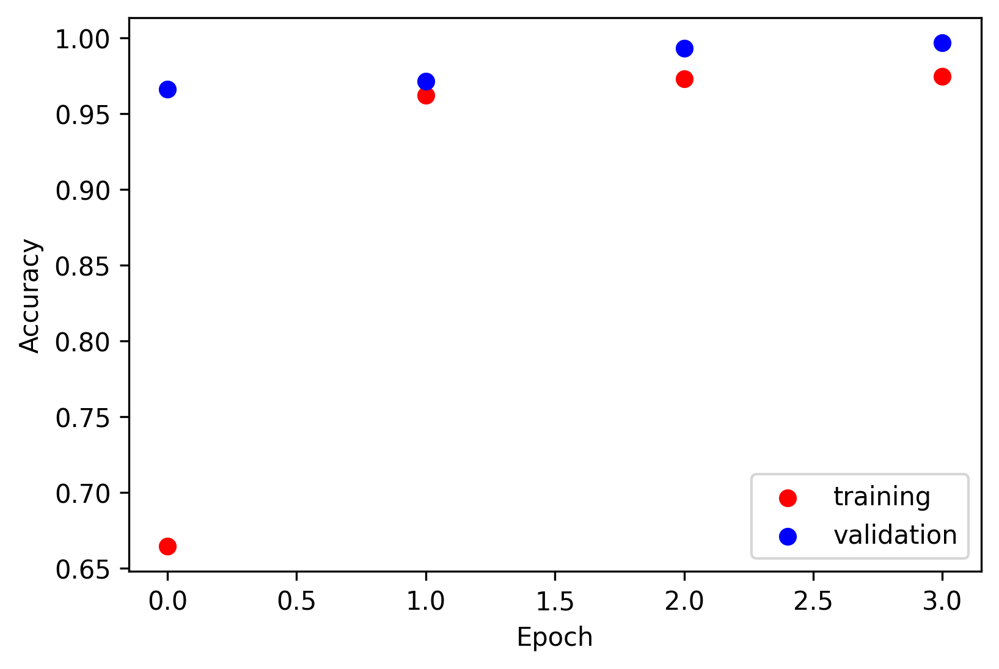

In [18]:
plt.figure(dpi=300)
plt.scatter(history.epoch,history.history['accuracy'], color = 'red', label = 'training')
plt.scatter(history.epoch,history.history['val_accuracy'], color = 'blue', label = 'validation')
plt.legend(loc=4)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.savefig(r'RESULTS/results_figures/accuracies.png', bbox_inches='tight')

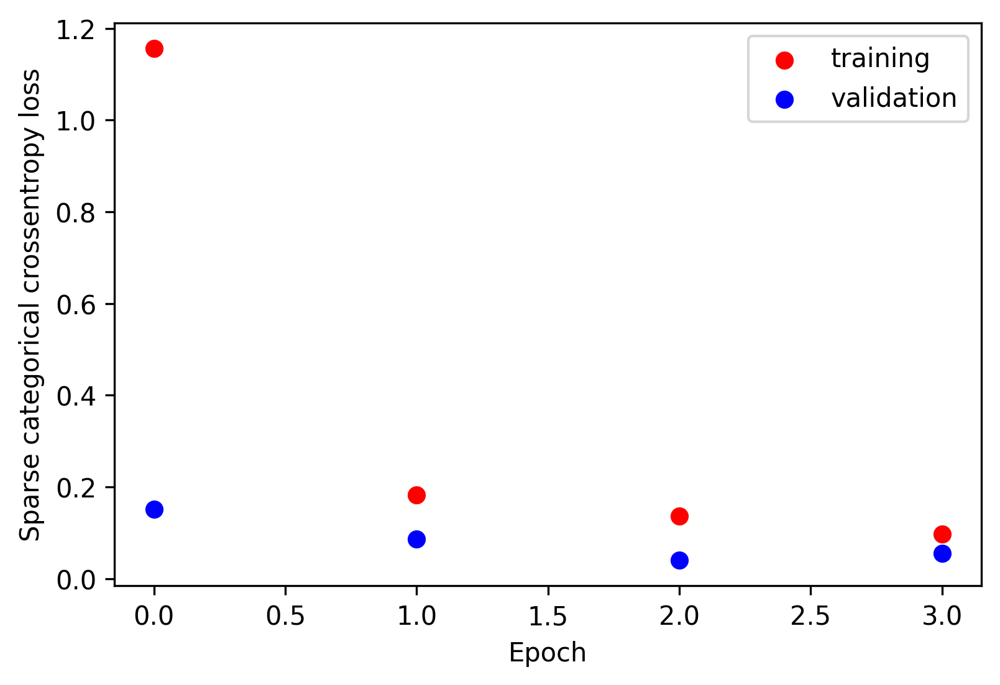

In [19]:
plt.figure(dpi=300)
plt.scatter(history.epoch,history.history['SparseCatCrossentropy'], color = 'red', label = 'training')
plt.scatter(history.epoch,history.history['val_SparseCatCrossentropy'],color = 'blue', label = 'validation')
plt.legend(loc=1)
plt.xlabel('Epoch')
plt.ylabel('Sparse categorical crossentropy loss')
plt.savefig(r'RESULTS/results_figures/sparse_cat_losses.png', bbox_inches='tight')

In [20]:
#check the weights
model.layers[0].trainable_weights

[<tf.Variable 'C1/kernel:0' shape=(3, 1, 3) dtype=float32, numpy=
 array([[[ 0.7963775 ,  0.4599409 , -0.17777663]],
 
        [[ 0.53172255, -0.32887614,  0.8721396 ]],
 
        [[ 0.9171538 ,  1.0927715 , -0.38431445]]], dtype=float32)>,
 <tf.Variable 'C1/bias:0' shape=(3,) dtype=float32, numpy=array([-0.00718738, -0.01124741, -0.00894083], dtype=float32)>]

In [21]:
from tensorflow.keras import backend as K
# with a Sequential model
get_1st_layer_output = K.function([model.layers[0].input],
                                  [model.layers[1].output])
# layer_output = get_1st_layer_output(x_test)
layer_output = get_1st_layer_output(X)

2022-07-19 11:29:59.437245: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudnn.so.8
2022-07-19 11:29:59.685541: I tensorflow/stream_executor/cuda/cuda_dnn.cc:359] Loaded cuDNN version 8204
2022-07-19 11:30:00.363377: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2022-07-19 11:30:00.842980: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublasLt.so.11


In [22]:
model.layers[0].get_config()

{'name': 'C1',
 'trainable': True,
 'batch_input_shape': (None, 229, 1),
 'dtype': 'float32',
 'filters': 3,
 'kernel_size': (3,),
 'strides': (1,),
 'padding': 'valid',
 'data_format': 'channels_last',
 'dilation_rate': (1,),
 'groups': 1,
 'activation': 'relu',
 'use_bias': True,
 'kernel_initializer': {'class_name': 'GlorotUniform',
  'config': {'seed': None}},
 'bias_initializer': {'class_name': 'Zeros', 'config': {}},
 'kernel_regularizer': None,
 'bias_regularizer': None,
 'activity_regularizer': None,
 'kernel_constraint': None,
 'bias_constraint': None}

In [23]:
layer_output[0].shape

(1968, 113, 3)

In [24]:
layer_output[0][0].shape

(113, 3)

# training accuracies vs epoch

In [25]:
model.evaluate(x_test,  y_test, verbose=2)

19/19 - 0s - loss: 0.0544 - SparseCatCrossentropy: 0.0550 - accuracy: 0.9966


[0.05441968888044357, 0.055005963891744614, 0.9966158866882324]

# softmax scores

In [26]:
probability_model = tf.keras.Sequential([model, 
                                         tf.keras.layers.Softmax()])

In [27]:
predictions = probability_model.predict(x_test)


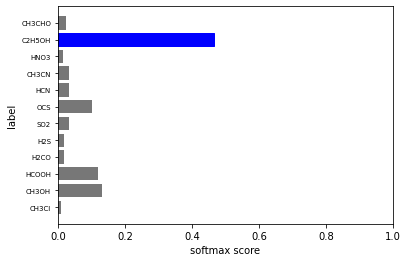

In [28]:
i=3
# simple_spectrum_fig(s.frequencies, x_test[i])
simple_plot_raw_scores(i, predictions, y_test,s.labels)

In [29]:
x_test.shape

(591, 229, 1)

In [30]:
np.squeeze(x_test).shape

(591, 229)

In [31]:
y_test.shape

(591,)

In [32]:
pred_y=np.argmax(model.predict(x_test), axis=-1)

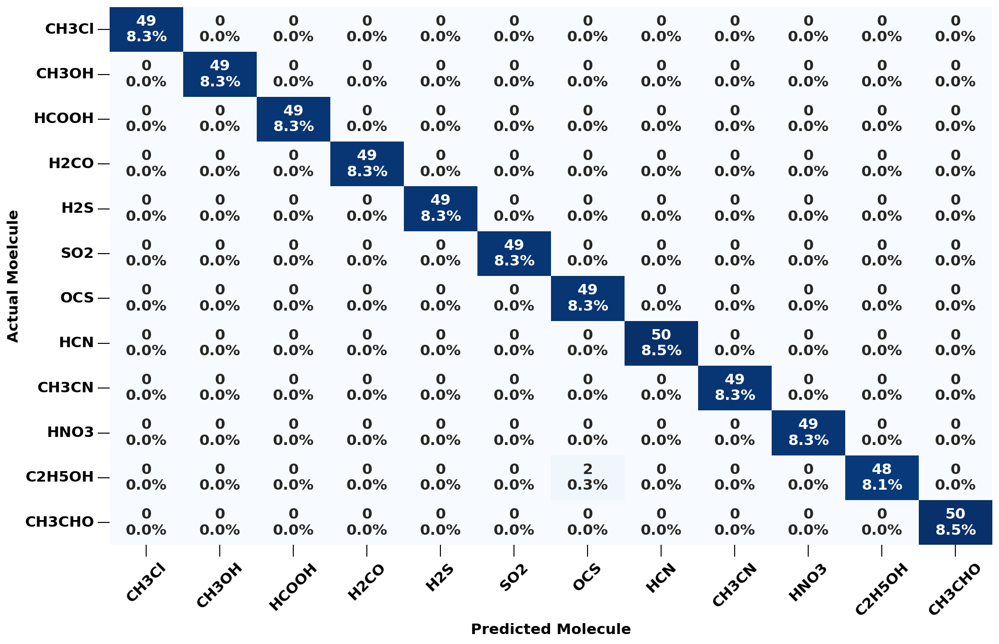

In [54]:
plt.rc('font', weight='bold')
cm = confusion_matrix(y_test, pred_y)

group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]

group_percentages = ["{0:.1%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]

annot_labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_counts,group_percentages)]

fig = plt.figure(figsize=(16,10), dpi = 150);
# plt.title('Confusion matrix);

# ax = sns.heatmap(cm, annot=True, cmap='PiYG');   #cmap='coolwarm' also good
ax = sns.heatmap(cm/np.sum(cm), annot=np.asarray(annot_labels).reshape(12,12),annot_kws={"size": 15}, fmt = '', cmap='Blues',cbar=False);   #cmap='coolwarm' also good
#ax = sns.heatmap(cm/np.sum(cm), annot=True, fmt='.2%', cmap='Blues') #Shows percentage
ax.set_xticklabels(s.labels);
ax.set_yticklabels(s.labels);

ax.xaxis.set_tick_params(which='major', 
                             size=12, 
                             width=1, 
                             direction='out',
                             labelsize=15)
                            
    
ax.yaxis.set_tick_params(which='major', 
                         size=12, 
                         width=1, 
                         direction='out',
                         labelsize=15)

plt.xlabel('Predicted Molecule', weight ='bold', fontsize = 15);
plt.ylabel('Actual Moelcule', weight ='bold', fontsize = 15);
plt.xticks(rotation=45);
plt.yticks(rotation=0);
plt.savefig(r'RESULTS/results_figures/cm_test_data.png', bbox_inches='tight')

In [56]:
classifier_internals(pred_y, y_test, y_train, 'simple_CNN-test')

---------------------------- simple_CNN-test -------------------------------
Fraction Correct[Accuracy]:
0.9966159052453468
Samples Correctly Classified:
(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 1

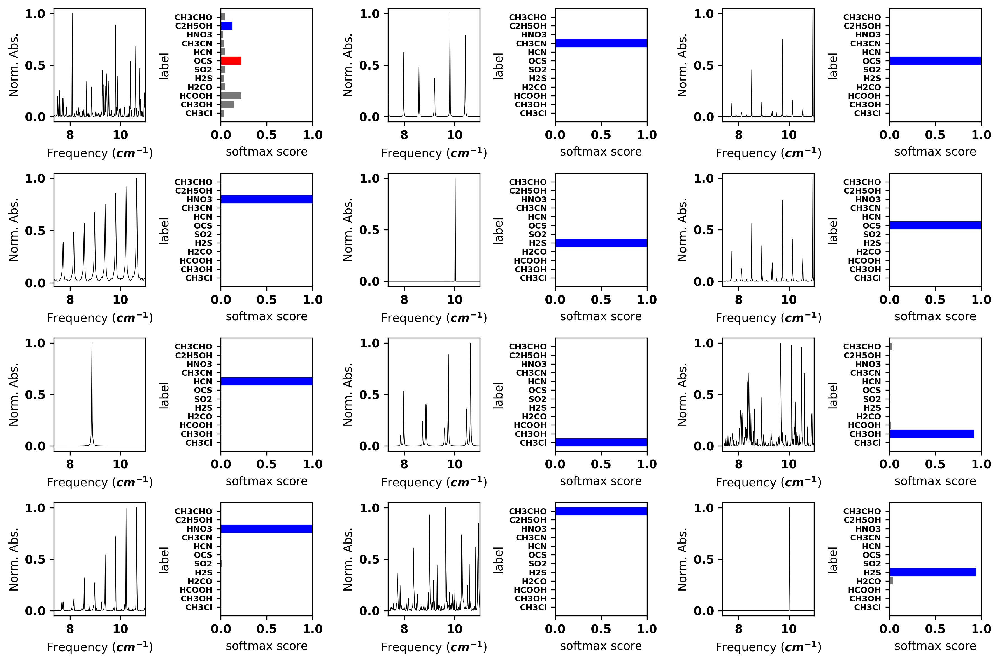

In [46]:
fig = plot_sequential_group_prediction(np.squeeze(x_test), y_test, predictions, s.frequencies,s.labels, 201, dpi = 300)

fig.savefig(r'RESULTS/results_figures/softmax_figures_test_spectra_start_idx_201.png', bbox_inches='tight')

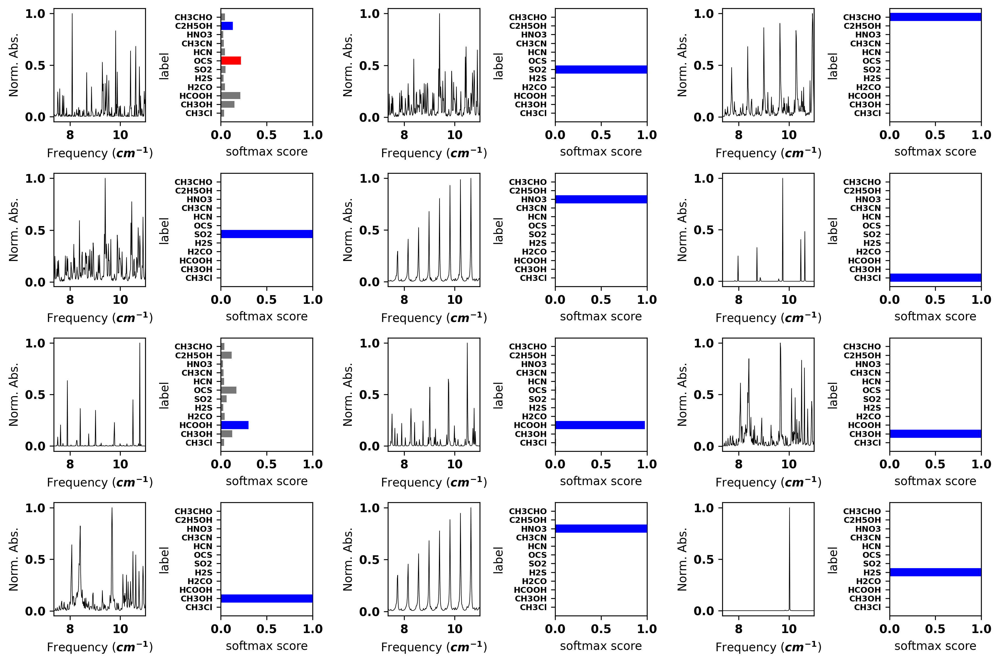

In [47]:
fig = plot_sequential_group_prediction(np.squeeze(x_test), y_test, predictions, s.frequencies,s.labels, 520, dpi = 300)

fig.savefig(r'RESULTS/results_figures/softmax_figures_test_spectra_start_idx_520.png', bbox_inches='tight')

In [66]:
def multiclass_roc_auc_score(y_test, y_pred, target, average="macro", figsize = (12, 8), dpi=150 ):
    '''function for scoring roc auc score for multi-class'''
    
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    
    fig, c_ax = plt.subplots(1,1, figsize = figsize, dpi=dpi)

    for (idx, c_label) in enumerate(target):
        fpr, tpr, thresholds = roc_curve(y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)))
    
    c_ax.plot(fpr, fpr, 'b-', label = 'Random Guessing')    
    c_ax.legend()
    c_ax.set_xlabel('False Positive Rate', weight ='bold', fontsize = 15)
    c_ax.set_ylabel('True Positive Rate', weight ='bold', fontsize = 15)
    
    c_ax.xaxis.set_tick_params(which='major', 
                                 size=12, 
                                 width=1, 
                                 direction='out',
                                 labelsize=15)


    c_ax.yaxis.set_tick_params(which='major', 
                             size=12, 
                             width=1, 
                             direction='out',
                             labelsize=15)

    

    plt.close()
    
    return roc_auc_score(y_test, y_pred, average=average), fig, c_ax

ROC AUC score: 0.998179581795818


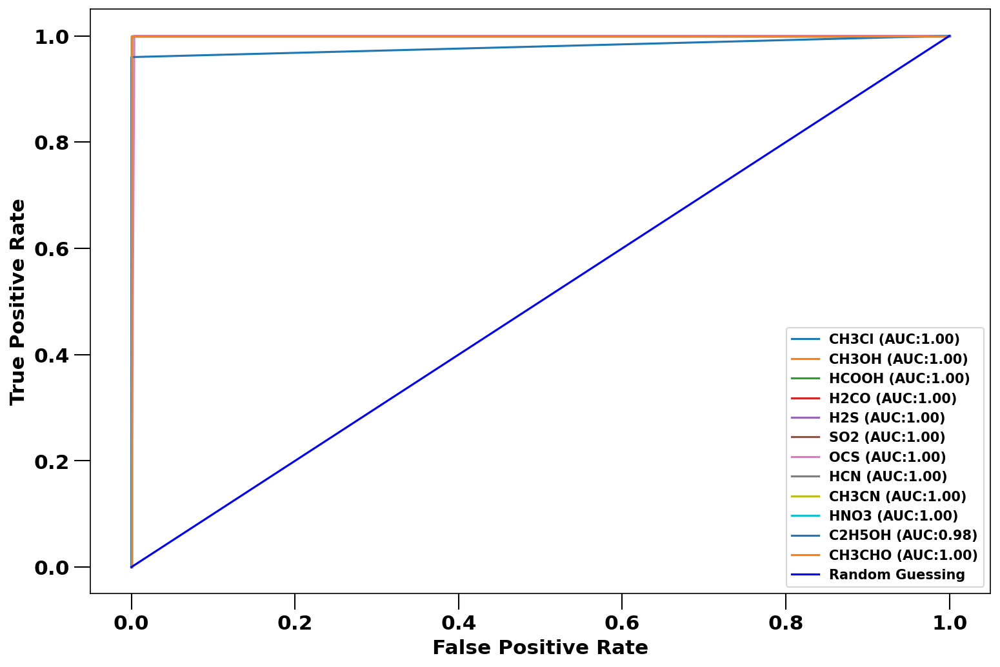

In [67]:

print('ROC AUC score:', multiclass_roc_auc_score(y_test, pred_y, s.labels)[0])

fig = multiclass_roc_auc_score(y_test, pred_y, s.labels)[1]
fig.savefig(r'RESULTS/results_figures/ROC_test_data.png', bbox_inches='tight')
fig

In [49]:
pred_y_train=np.argmax(model.predict(x_train), axis=-1)

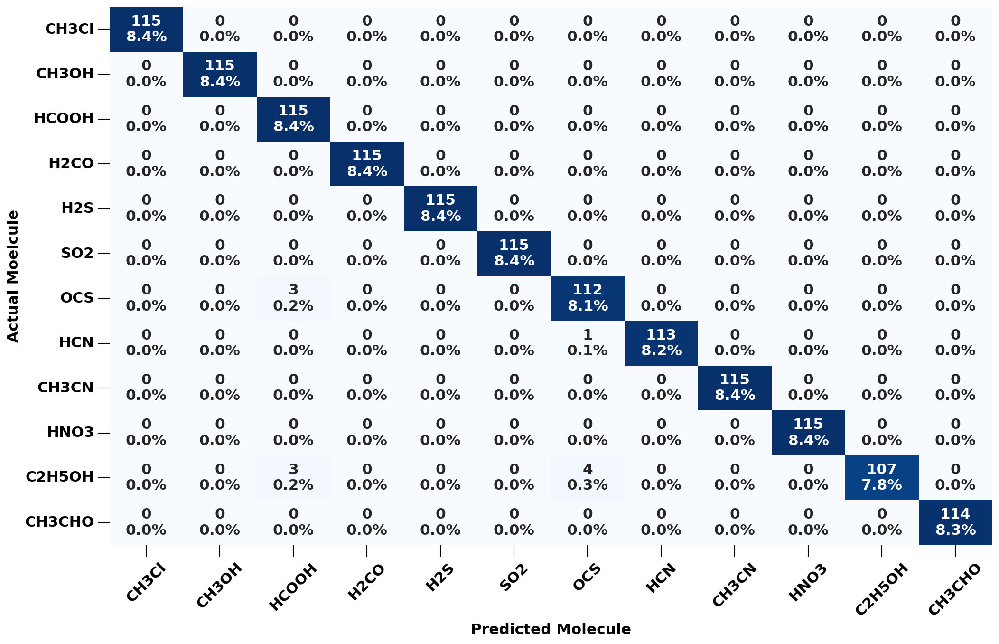

In [55]:
cm = confusion_matrix(y_train, pred_y_train)

group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]

group_percentages = ["{0:.1%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]

annot_labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_counts,group_percentages)]

fig = plt.figure(figsize=(16,10), dpi = 150);
# plt.title('Confusion matrix);

# ax = sns.heatmap(cm, annot=True, cmap='PiYG');   #cmap='coolwarm' also good
ax = sns.heatmap(cm/np.sum(cm), annot=np.asarray(annot_labels).reshape(12,12),annot_kws={"size": 15}, fmt = '', cmap='Blues',cbar=False);   #cmap='coolwarm' also good
#ax = sns.heatmap(cm/np.sum(cm), annot=True, fmt='.2%', cmap='Blues') #Shows percentage
ax.set_xticklabels(s.labels);
ax.set_yticklabels(s.labels);

ax.xaxis.set_tick_params(which='major', 
                             size=12, 
                             width=1, 
                             direction='out',
                             labelsize=15)
                            
    
ax.yaxis.set_tick_params(which='major', 
                         size=12, 
                         width=1, 
                         direction='out',
                         labelsize=15)

plt.xlabel('Predicted Molecule', weight ='bold', fontsize = 15);
plt.ylabel('Actual Moelcule', weight ='bold', fontsize = 15);
plt.xticks(rotation=45);
plt.yticks(rotation=0);
plt.savefig(r'RESULTS/results_figures/cm_train_data.png', bbox_inches='tight')

In [57]:
classifier_internals(pred_y_train, y_train, y_train, 'simple_CNN-train')

---------------------------- simple_CNN-train -------------------------------
Fraction Correct[Accuracy]:
0.9920116194625999
Samples Correctly Classified:
(array([   0,    1,    2, ..., 1374, 1375, 1376]),)
Samples Incorrectly Classified:
(array([ 337,  394,  578,  640,  904, 1112, 1190, 1215, 1224, 1329, 1331]),)
All Train y with label identifier [ 6  3  0 ...  8  0 10] 

Data misidentified:

Test y with incorrect indexes label identifier [10 10  6 10  7  6 10 10 10  6 10] 

Predicted y with incorrect indexes label identifier [6 2 2 2 6 2 6 6 6 2 2] 

Correct data identified:

Test y with correct indexes label identifier [ 6  3  0 ...  8  0 10] 

Predicted y correct indexes label identifier [ 6  3  0 ...  8  0 10] 

All Test y with label identifier [ 6  3  0 ...  8  0 10] 

All Pred y with label identifier [ 6  3  0 ...  8  0 10] 



ROC AUC score: 0.9956258867327256


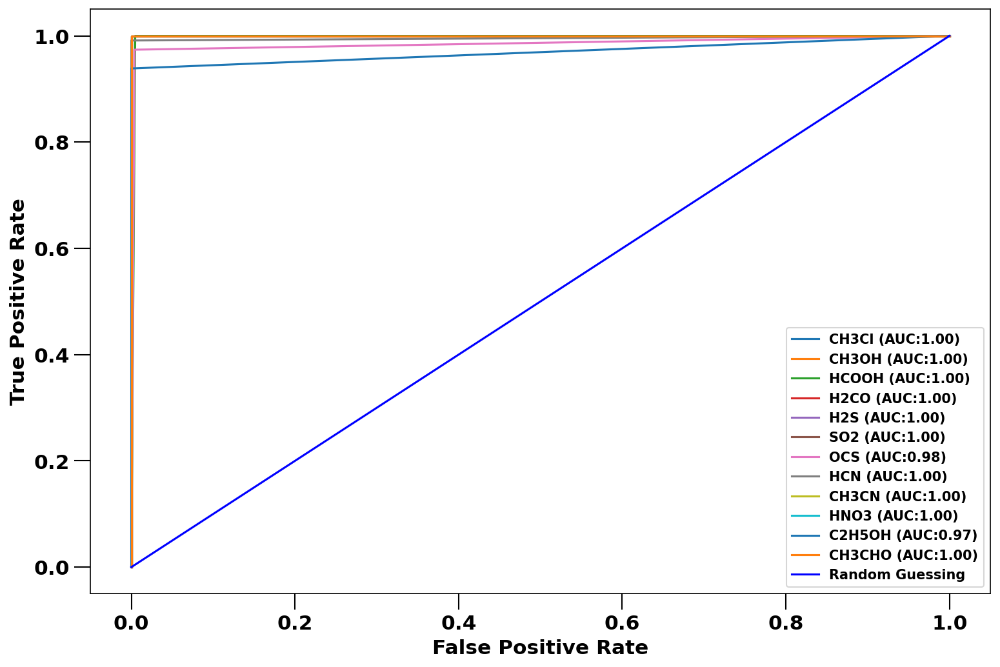

In [68]:

print('ROC AUC score:', multiclass_roc_auc_score(y_train, pred_y_train, s.labels)[0])

fig = multiclass_roc_auc_score(y_train, pred_y_train, s.labels)[1]
fig.savefig(r'RESULTS/results_figures/ROC_train_data.png', bbox_inches='tight')
fig

In [69]:
predictions_on_train = probability_model.predict(x_train)

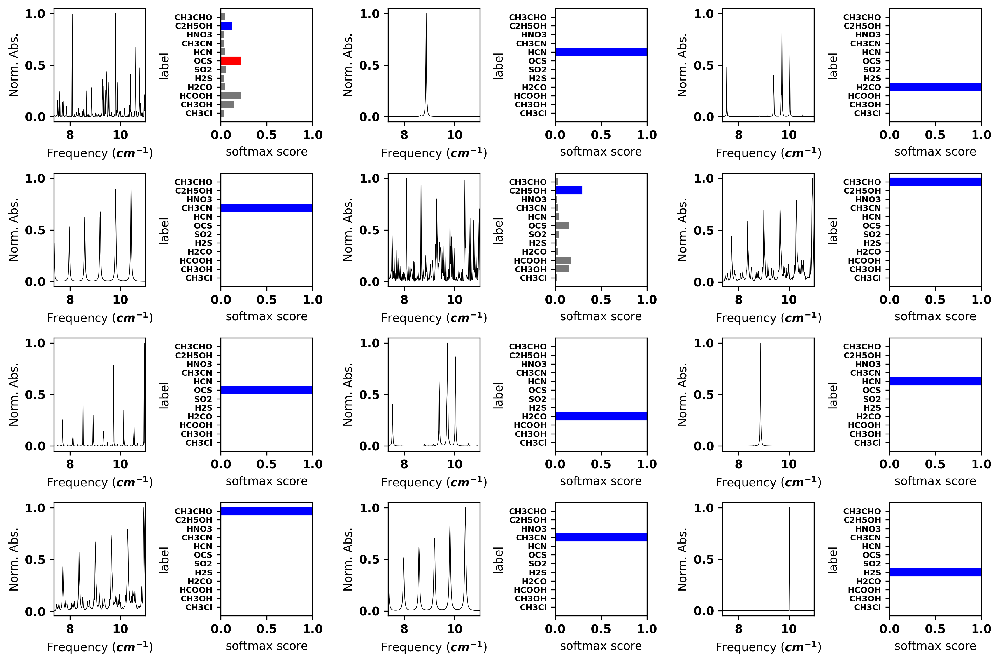

In [70]:
fig = plot_sequential_group_prediction(np.squeeze(x_train), y_train, predictions_on_train, s.frequencies,s.labels, 337, dpi = 300)

fig.savefig(r'RESULTS/results_figures/softmax_figures_train_spectra_start_idx_337.png', bbox_inches='tight')

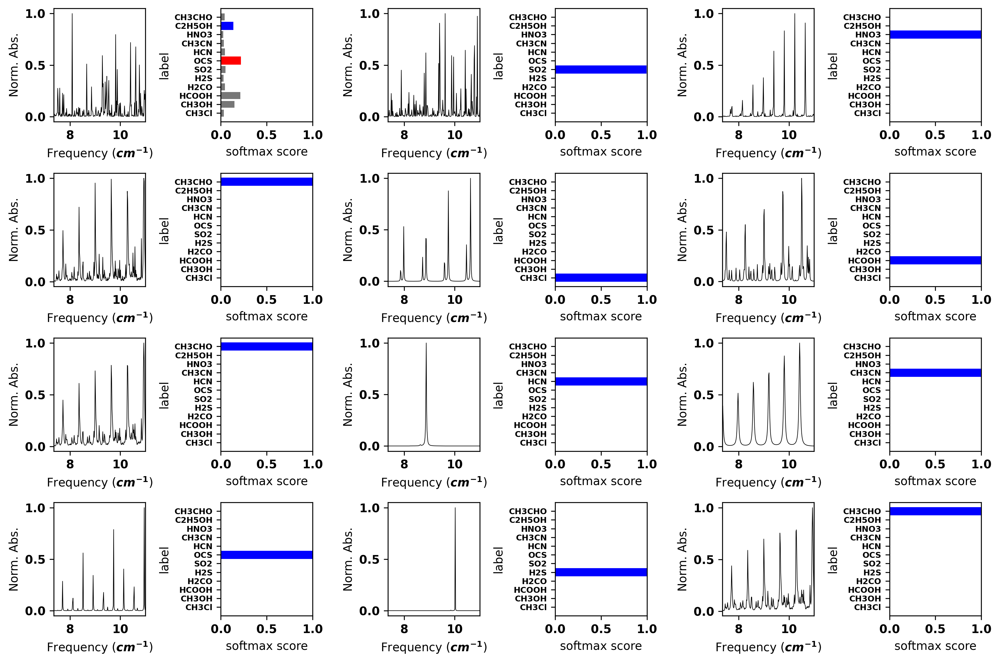

In [71]:
fig = plot_sequential_group_prediction(np.squeeze(x_train), y_train, predictions_on_train, s.frequencies,s.labels, 1190, dpi = 300)

fig.savefig(r'RESULTS/results_figures/softmax_figures_train_spectra_start_idx_1190.png', bbox_inches='tight')

In [72]:
pred_y_exp=np.argmax(model.predict(Xexp), axis=-1)
print(pred_y_exp)

[10 10 10 10 10 10  2  2  2  2  2  2  1  1  1  1  2  1  0  0  0  0  0  0
  8  8  8  8  8  8 11 11 11 11 11 11]


In [73]:
predictions_exp = probability_model.predict(Xexp) # softmax scores for experiment


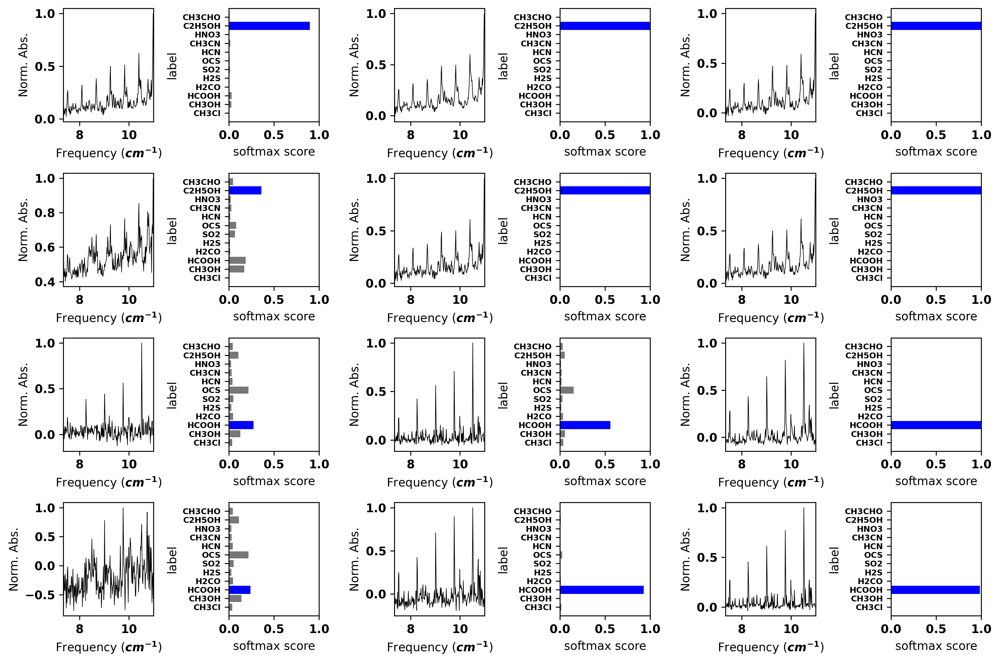

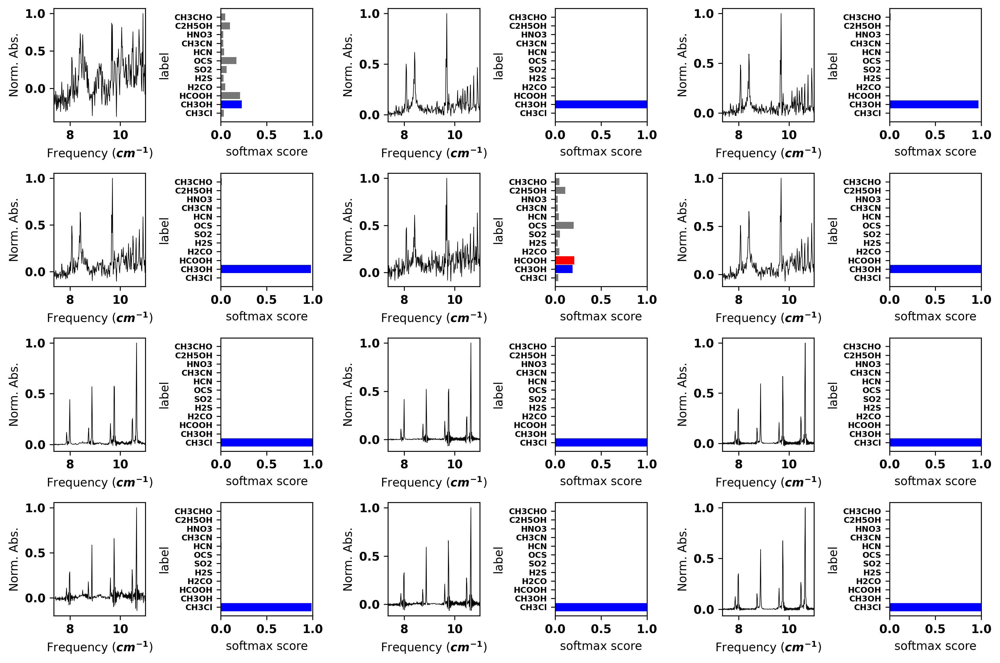

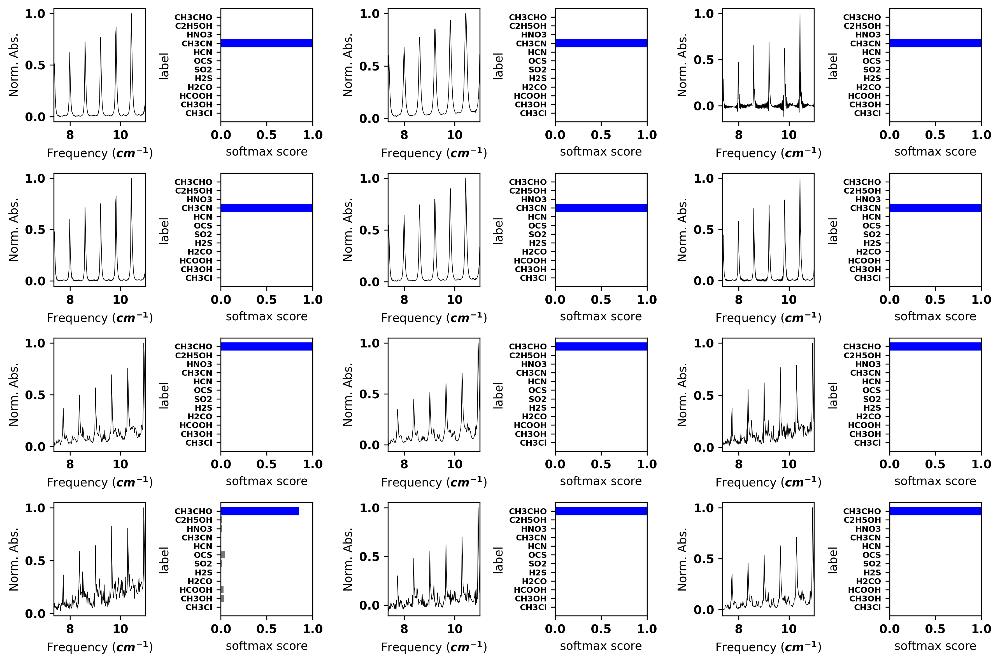

In [74]:
fig = plot_sequential_group_prediction(Xexp, yexp, predictions_exp, s.frequencies, 
                                 s.labels, 0)

fig.savefig(r'RESULTS/results_figures/softmax_figures_exp_spectra_start_idx_0_to_11.png', bbox_inches='tight')

fig = plot_sequential_group_prediction(Xexp, yexp, predictions_exp, s.frequencies, 
                                 s.labels, 12)

fig.savefig(r'RESULTS/results_figures/softmax_figures_exp_spectra_start_idx_12_to_23.png', bbox_inches='tight')

fig = plot_sequential_group_prediction(Xexp, yexp, predictions_exp, s.frequencies, 
                                 s.labels, 24)

fig.savefig(r'RESULTS/results_figures/softmax_figures_exp_spectra_start_idx_24_to_36.png', bbox_inches='tight')

In [75]:
print([s.labels[i] for i in s.exp_targets])

['C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO']


In [76]:
cm = confusion_matrix(yexp, pred_y_exp)

# group_counts = ["{0:0.0f}".format(value) for value in
#                 cm.flatten()]

# group_percentages = ["{0:.2%}".format(value) for value in
#                      cm.flatten()/np.sum(cm)]

# annot_labels = [f"{v1}\n{v2}" for v1, v2 in
#           zip(group_counts,group_percentages)]

# fig = plt.figure(figsize=(16,10), dpi = 600);
# # plt.title('Confusion matrix);

# # ax = sns.heatmap(cm, annot=True, cmap='PiYG');   #cmap='coolwarm' also good
# ax = sns.heatmap(cm/np.sum(cm), annot=np.asarray(annot_labels).reshape(6,6), fmt = '', cmap='RdBu_r',cbar=False);   #cmap='coolwarm' also good
# #ax = sns.heatmap(cm/np.sum(cm), annot=True, fmt='.2%', cmap='Blues') #Shows percentage
# ax.set_xticklabels(np.unique([s.labels[i] for i in s.exp_targets]));
# ax.set_yticklabels(np.unique([s.labels[i] for i in s.exp_targets]));
# plt.xlabel('Predicted Molecule');
# plt.ylabel('Actual Moelcule');
# plt.xticks(rotation=45);
# plt.yticks(rotation=0);
# plt.savefig(r'RESULTS/results_figures/cm_exp_data.png', bbox_inches='tight')

ROC AUC score: 0.9833333333333334


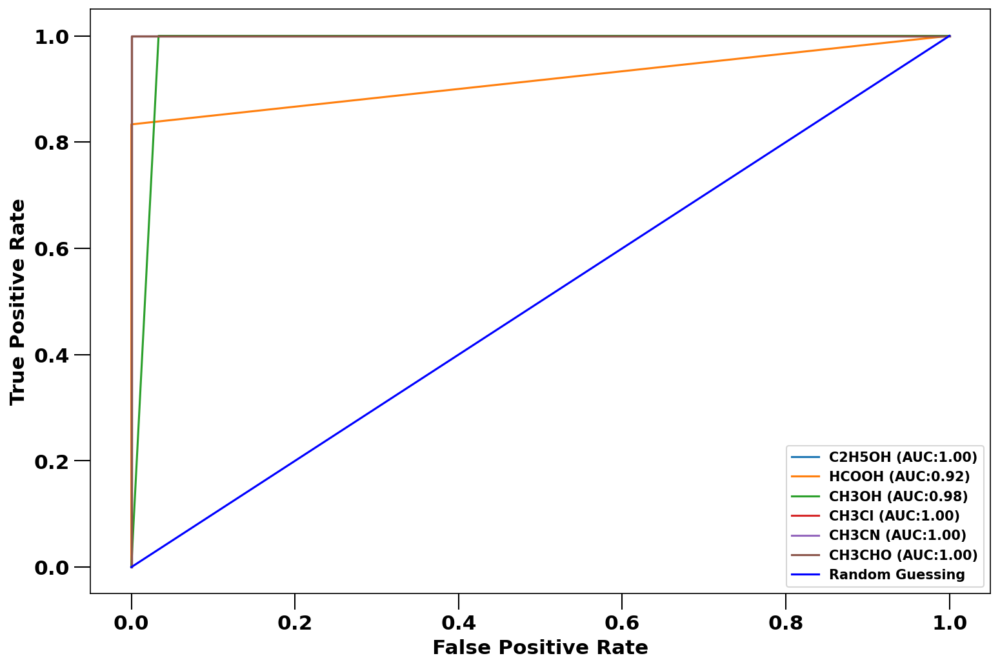

In [77]:

print('ROC AUC score:', multiclass_roc_auc_score(yexp, pred_y_exp, s.labels_exp)[0])

fig = multiclass_roc_auc_score(yexp, pred_y_exp, s.labels_exp)[1]
fig.savefig(r'RESULTS/results_figures/ROC_exp_data.png', bbox_inches='tight')
fig

### GRAD-CAM

## PR Curve for test and exp_data

In [41]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize

In [42]:
s.label_id

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [43]:
Y_test = label_binarize(y_test, classes=s.label_id)


In [44]:
Y_test_exp = label_binarize(yexp, classes=s.label_id)

In [45]:
Y_test_exp

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1,

In [46]:
from sklearn.metrics import PrecisionRecallDisplay
from itertools import cycle


def voc_net_pr_curve(n_classes,scores, Y_test, all_unique_labels):

    '''
    scores:raw score values from classifier
    Y_test: label binarized values
    
    '''

    n_classes =n_classes
    y_score = scores

    precision = dict()
    recall = dict()
    average_precision = dict()
    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(Y_test[:, i],
                                                            y_score[:, i])
        average_precision[i] = average_precision_score(Y_test[:, i], y_score[:, i])

    # A "micro-average": quantifying score on all classes jointly
    precision["micro"], recall["micro"], _ = precision_recall_curve(Y_test.ravel(),
        y_score.ravel())
    average_precision["micro"] = average_precision_score(Y_test, y_score,
                                                         average="micro")
    
    print('Average precision score, micro-averaged over all classes: {0:0.2f}'
          .format(average_precision["micro"]))
    
    
    # setup plot details
    colors = cycle(["red", "yellow", "green", "blue",
                    "olive", "navy", "turquoise", "darkorange", 
                    "cornflowerblue", "teal"])

    _, ax = plt.subplots(figsize=(8, 8),dpi=300)

    f_scores = np.linspace(0.2, 1, num=5)
    lines, labels = [], []
    for f_score in f_scores:
        x = np.linspace(0.01, 1)
        y = f_score * x / (2 * x - f_score)
        (l,) = plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.4)
        plt.annotate("f1={0:0.1f}".format(f_score), xy=(0.9, y[45] + 0.02))

    display = PrecisionRecallDisplay(
        recall=recall["micro"],
        precision=precision["micro"],
        average_precision=average_precision["micro"],
    )
    display.plot(ax=ax, name="Micro-average precision-recall", color="black")

    for i, color in zip(range(n_classes), colors):
        display = PrecisionRecallDisplay(
            recall=recall[i],
            precision=precision[i],
            average_precision=average_precision[i],
        )
        display.plot(ax=ax, name=f"Precision-recall for {all_unique_labels[i]}", color=color)

    # add the legend for the iso-f1 curves
    handles, labels = display.ax_.get_legend_handles_labels()
    handles.extend([l])
    labels.extend(["iso-f1 curves"])
    # set the legend and the axes
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.legend(handles=handles, labels=labels, loc="lower left", prop={'size': 6})
#     ax.set_title("Precision-Recall curve.")

    # plt.show()
    
    return _, precision, recall, average_precision

Average precision score, micro-averaged over all classes: 1.00


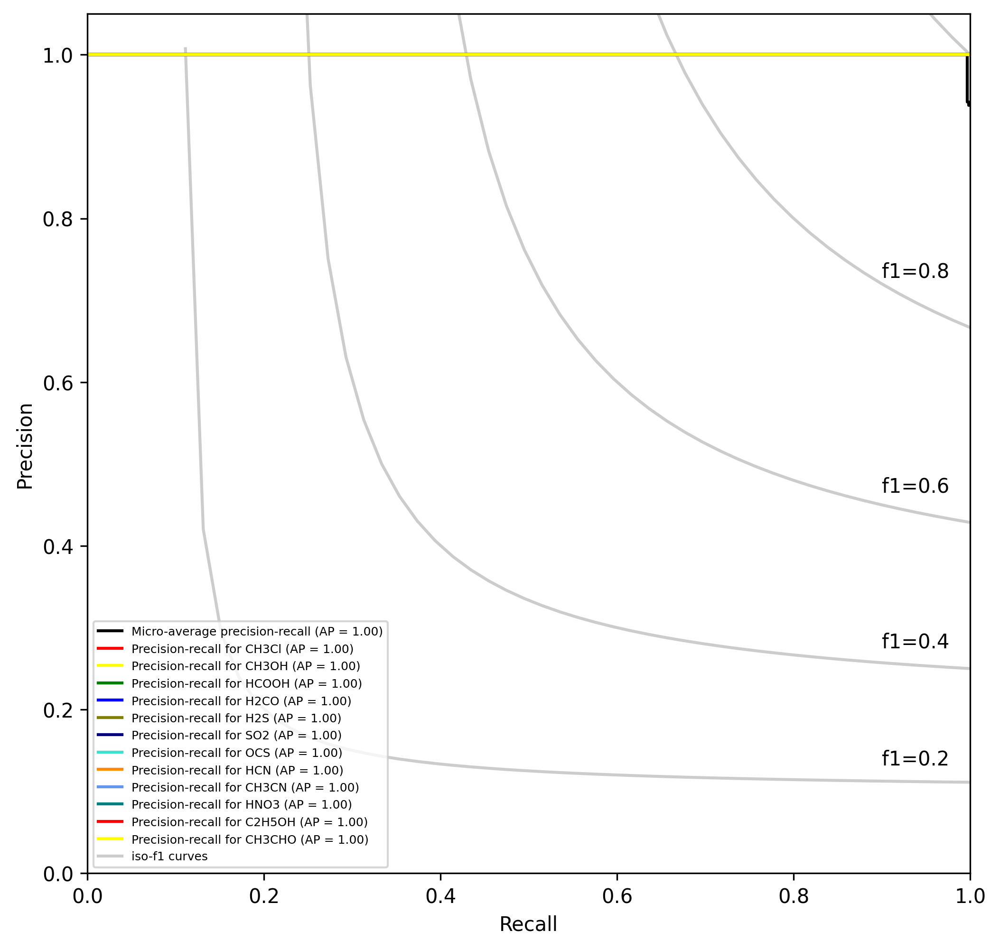

In [47]:
fig = voc_net_pr_curve(12 , predictions, Y_test, s.labels);
plt.savefig(r'RESULTS/results_figures/VOC_Net_pr_curve_test.png', bbox_inches='tight')

/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/hom

Average precision score, micro-averaged over all classes: 1.00


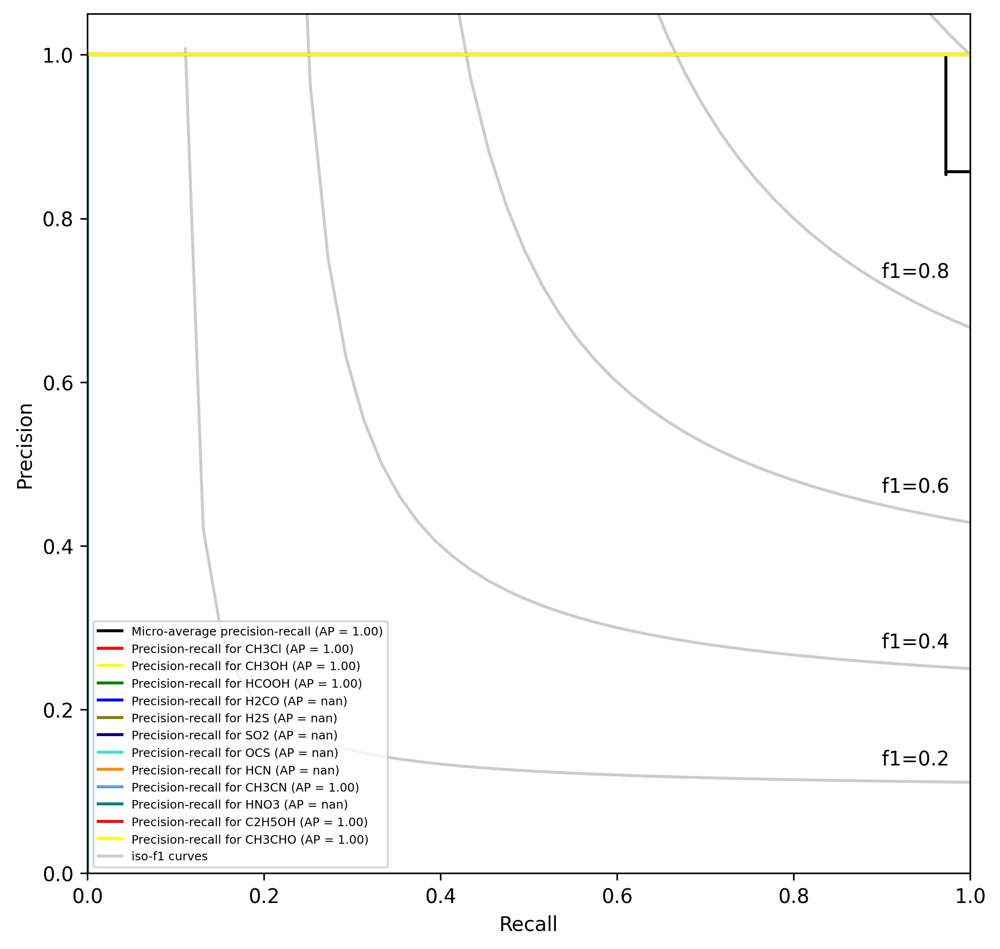

In [48]:
fig = voc_net_pr_curve(12 , predictions_exp, Y_test_exp, s.labels);
plt.savefig(r'RESULTS/results_figures/VOC_Net_pr_curve_exp.png', bbox_inches='tight')

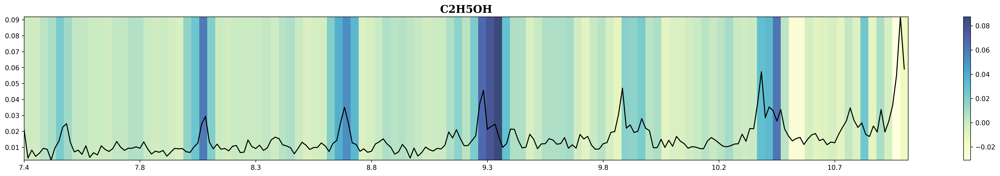

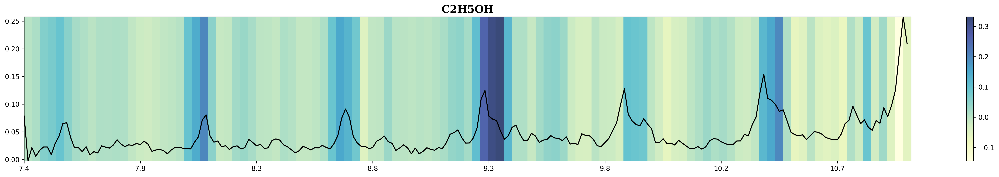

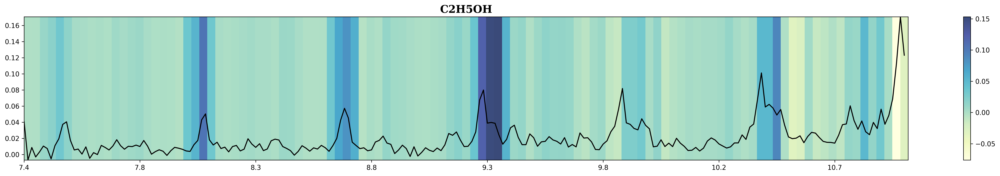

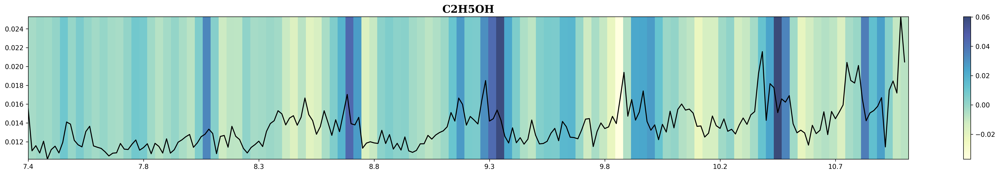

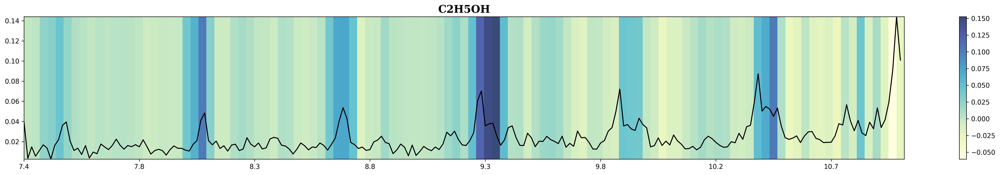

...

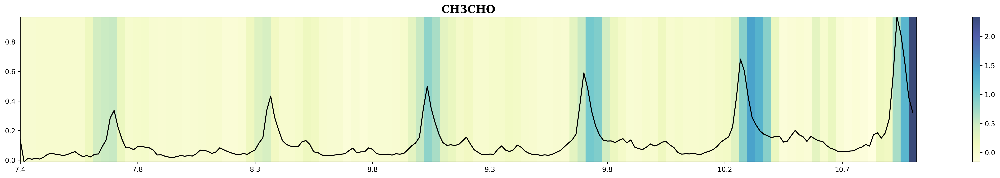

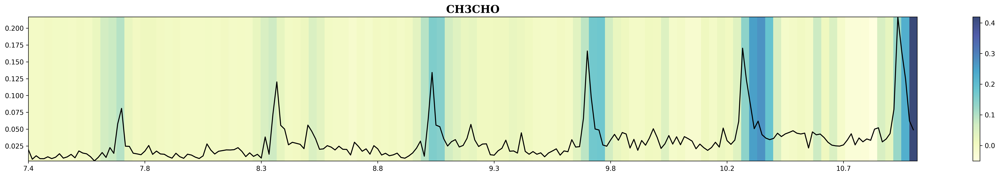

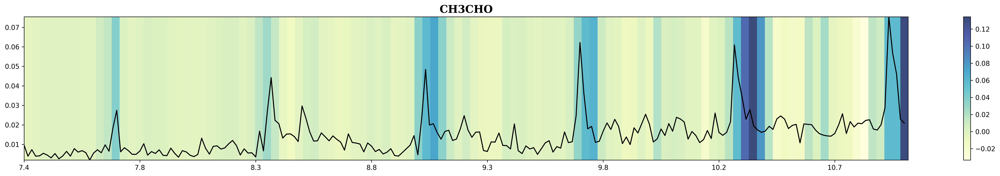

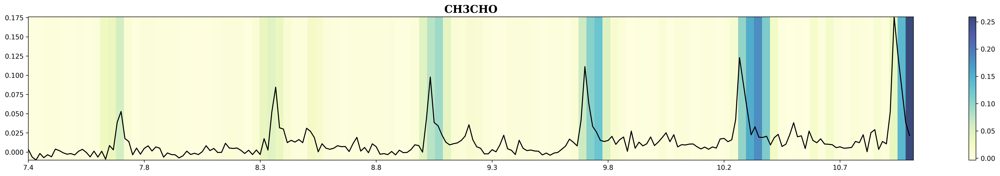

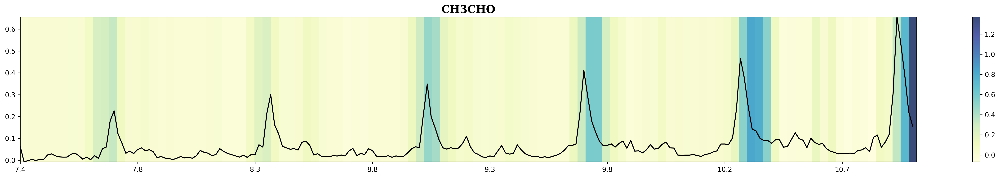

In [49]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

def grad_cam(layer_name, data):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )
    last_conv_layer_output, preds = grad_model(data)

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(data)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0))

    last_conv_layer_output = last_conv_layer_output[0]

    heatmap = last_conv_layer_output * pooled_grads
    heatmap = tf.reduce_mean(heatmap, axis=(1))
    heatmap = np.expand_dims(heatmap,0)
    return heatmap

layer_name = "C3"

font = {'family': 'serif',
        'color':  'black',
        'weight': 'bold',
        'size': 16,
        }


count = 0
for i,j in zip(Xexp,yexp):
    
    data = np.expand_dims(i,0)
    heatmap = grad_cam(layer_name,data)

    fig = plt.figure(figsize=(30,4),dpi=300)
    plt.imshow(np.expand_dims(heatmap,axis=2),cmap='YlGnBu', aspect="auto", interpolation='nearest',extent=[0,229,i.min(),i.max()], alpha=0.8)
    
    ticklist = range(0,229)
    plt.xticks(ticklist[::30], np.round(s.frequencies.tolist()[::30], decimals=1) ) # tick every 40th frequency
    plt.plot(i,'k')
    plt.title(f'{s.labels[j]}', fontdict=font)
    plt.colorbar()
    plt.clim(np.min(heatmap),np.max(heatmap))
    
    plt.show()
    
    fig.savefig(r'RESULTS/class_activation_maps/CAM_exp' + str(count) + '.png', bbox_inches='tight')
    count = count + 1

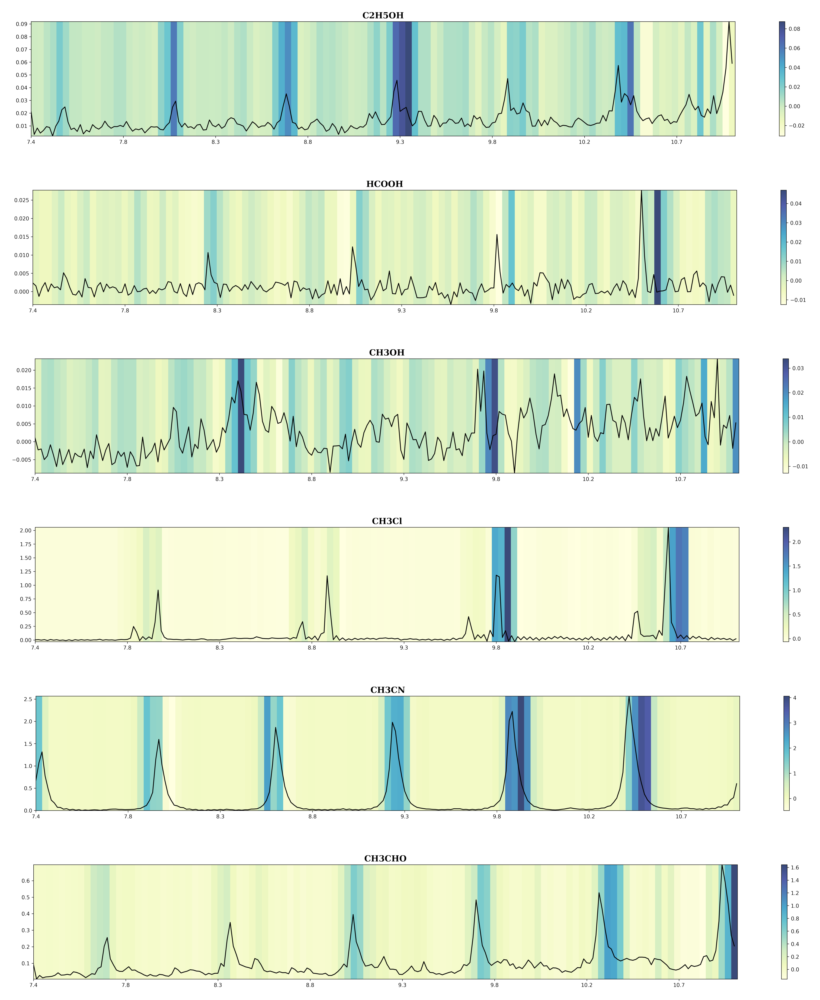

In [50]:
# Imports PIL module 
from PIL import Image
  
# open method used to open different extension image file
im0 = Image.open(r'RESULTS/class_activation_maps/CAM_exp' + str(0) + '.png') 
im1 = Image.open(r'RESULTS/class_activation_maps/CAM_exp' + str(6) + '.png') 
im2 = Image.open(r'RESULTS/class_activation_maps/CAM_exp' + str(12) + '.png') 
im3 = Image.open(r'RESULTS/class_activation_maps/CAM_exp' + str(18) + '.png') 
im4 = Image.open(r'RESULTS/class_activation_maps/CAM_exp' + str(24) + '.png') 
im5 = Image.open(r'RESULTS/class_activation_maps/CAM_exp' + str(30) + '.png') 
  

fig, ax = plt.subplots(6)
fig.set_size_inches(16, 16)
fig.set_dpi(300)
plt.axis(False)

ax[0].imshow(im0)
ax[0].axis(False)
ax[1].imshow(im1)
ax[1].axis(False)
ax[2].imshow(im2)
ax[2].axis(False)
ax[3].imshow(im3)
ax[3].axis(False)
ax[4].imshow(im4)
ax[4].axis(False)
ax[5].imshow(im5)
ax[5].axis(False)

fig.savefig(r'RESULTS/results_figures/Class_activation_maps_combined_V1.png', bbox_inches='tight')

In [71]:
()

[]

In [64]:
#view kernel values

#construct the graph


gr = tf.compat.v1.get_default_graph()


In [68]:
()

[]

In [69]:
conv1_kernel_val = gr.get_tensor_by_name('C1').eval()

ValueError: The name 'C1' looks like an (invalid) Operation name, not a Tensor. Tensor names must be of the form "<op_name>:<output_index>".